In [1]:
% matplotlib inline 

import nibabel as nib
import nibabel.gifti
import nilearn
from nilearn import datasets, plotting
import pandas as pd
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt
import pylab as plt
from matplotlib.colors import ListedColormap
mpl.rcParams['svg.fonttype'] = 'none'

import sys
sys.path.append('gradient_data/src/')
from viz import *

/export/scratch/b/han424/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
def imageCrop(filename):

    from PIL import Image

    i1 = Image.open(filename)
    i2 = np.array(i1)
    i2[i2.sum(axis=2) == 255*4,:] = 0
    i3 = i2.sum(axis=2)
    x = np.where((i3.sum(axis=1) != 0) * 1)[0]
    y = np.where((i3.sum(axis=0) != 0) * 1)[0]

    result = Image.fromarray(i2[x.squeeze()][:,y.squeeze()])
    result.save(filename)

# Visualization on human cortical surface

In [3]:
import h5py, sys, io, numpy as np
import nibabel as nib 

In [4]:
surfmL = nib.freesurfer.read_geometry('gradient_data/templates/S900.L.midthickness_MSMAll.32k_fs_LR.surf')
surfiL = nib.freesurfer.read_geometry('gradient_data/templates/S900.L.very_inflated_MSMAll.32k_fs_LR.surf')
surfL = []
surfL.append(np.array(surfmL[0]*0.3 + surfiL[0]*0.7))
surfL.append(surfmL[1])

In [5]:
surfmL[1]

array([[   68,    12,     0],
       [  180,    12,    68],
       [  180,    13,    12],
       ...,
       [ 8440, 32491, 21432],
       [ 8440,  8441, 32491],
       [    9,  8440, 21432]], dtype=int32)

In [6]:
surfiL[1]

array([[   68,    12,     0],
       [  180,    12,    68],
       [  180,    13,    12],
       ...,
       [ 8440, 32491, 21432],
       [ 8440,  8441, 32491],
       [    9,  8440, 21432]], dtype=int32)

In [7]:
surfmR = nib.freesurfer.read_geometry('gradient_data/templates/S900.R.midthickness_MSMAll.32k_fs_LR.surf')
surfiR = nib.freesurfer.read_geometry('gradient_data/templates/S900.R.very_inflated_MSMAll.32k_fs_LR.surf')
surfR = []
surfR.append(np.array(surfmR[0]*0.3 + surfiR[0]*0.7))
surfR.append(surfmR[1])

In [8]:
res = nib.load('gradient_data/templates/hcp.tmp.lh.dscalar.nii').get_fdata()
cortL = np.squeeze(np.array(np.where(res != 0)[1], dtype=np.int32))

pixdim[1,2,3] should be non-zero; setting 0 dims to 1


In [9]:
cortL.shape

(29696,)

In [10]:
res = nib.load('gradient_data/templates/hcp.tmp.rh.dscalar.nii').get_fdata()
cortR = np.squeeze(np.array(np.where(res != 0)[1], dtype=np.int32))

pixdim[1,2,3] should be non-zero; setting 0 dims to 1


In [11]:
cortR.shape

(29716,)

In [12]:
29696 + 29716

59412

In [13]:
cortLen = len(cortL) + len(cortR)

sulcL = np.zeros(len(surfL[0]))
sulcR = np.zeros(len(surfR[0]))
sulcL[cortL] = -1 * nib.load('gradient_data/templates/S900.sulc_MSMAll.32k_fs_LR.dscalar.nii').get_fdata().squeeze()[:len(cortL)]
sulcR[cortR] = -1 * nib.load('gradient_data/templates/S900.sulc_MSMAll.32k_fs_LR.dscalar.nii').get_fdata().squeeze()[len(cortL)::]
sulcL[np.setdiff1d(range(32492),cortL)] = -1 * nib.load('gradient_data/templates/Q1-Q6_R440.sulc.32k_fs_LR.dscalar.nii').get_fdata().squeeze()[np.setdiff1d(range(32492),cortL)]
sulcR[np.setdiff1d(range(32492),cortR)] = -1 * nib.load('gradient_data/templates/Q1-Q6_R440.sulc.32k_fs_LR.dscalar.nii').get_fdata().squeeze()[32492+np.setdiff1d(range(32492),cortR)]

pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


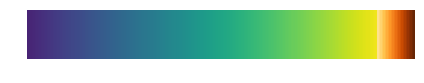

In [14]:
import matplotlib.colors as colors

def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

cmap = plt.get_cmap('nipy_spectral')
new_cmap = truncate_colormap(cmap, 0.2, 0.95)

#colors1 = plt.cm.YlGnBu(np.linspace(0, 1, 128))
first = int((128*2)-np.round(255*(1.-0.90)))
second = (256-first)
#colors2 = new_cmap(np.linspace(0, 1, first))
colors2 = plt.cm.viridis(np.linspace(0.1, .98, first))
colors3 = plt.cm.YlOrBr(np.linspace(0.25, 1, second))
colors4 = plt.cm.PuBu(np.linspace(0., 0.5, second))
#colors4 = plt.cm.pink(np.linspace(0.9, 1., second))
# combine them and build a new colormap
cols = np.vstack((colors2,colors3))
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', cols)

num = 256
gradient = range(num)
for x in range(5):
    gradient = np.vstack((gradient, gradient))

fig, ax = plt.subplots(nrows=1)
ax.imshow(gradient, cmap=mymap, interpolation='nearest')
ax.set_axis_off()
fig.tight_layout()

plt.show()

# Visualize surfaces

In [15]:
# Load embedding results
emb = np.load('gradient_data/embedded/embedding_dense_emb.npy')

In [16]:
dataL = np.zeros((len(surfL[0]), emb.shape[1]))

In [17]:
dataL[cortL,:] = emb[0:len(cortL),:]

In [18]:
dataR = np.zeros((len(surfR[0]), emb.shape[1]))

In [19]:
dataR[cortR,:] = emb[len(cortL):cortLen,:]

In [20]:
print(dataL.shape)
print(np.sum(dataL[:, 0] != 0))

(32492, 10)
29696


In [21]:
print(dataR.shape)
print(np.sum(dataR[:, 0] != 0))

(32492, 10)
29716


In [22]:
print(len(cortL) + len(cortR))
print(len(emb) -len(cortL) - len(cortR))
print(len(emb))

59412
31870
91282


In [23]:
import viz

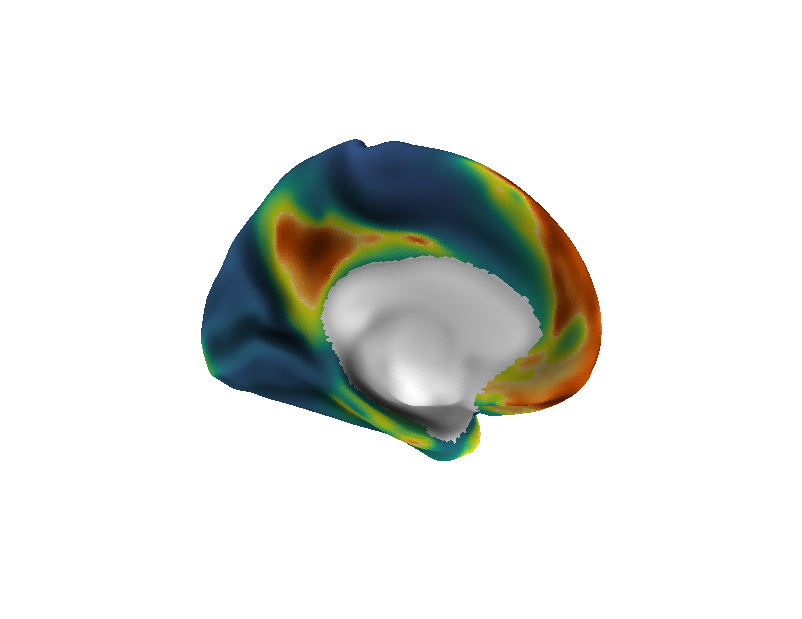

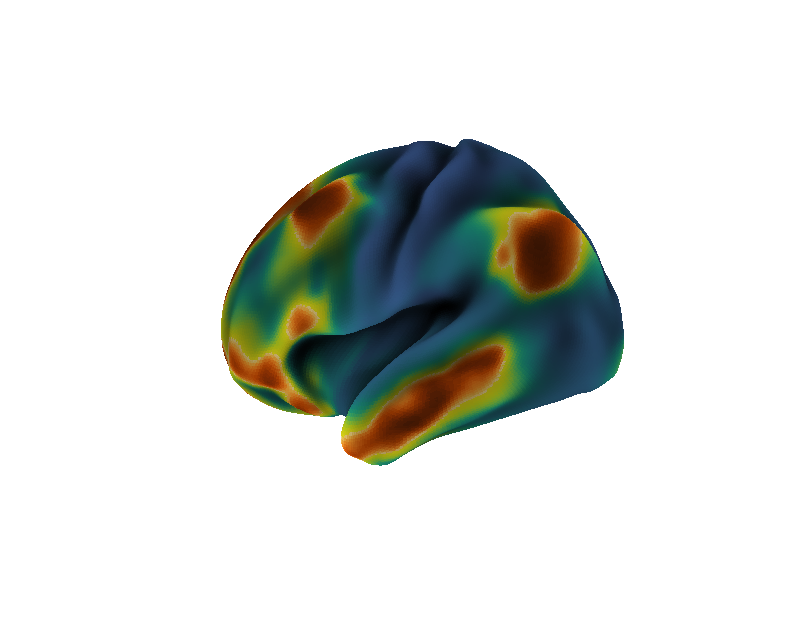

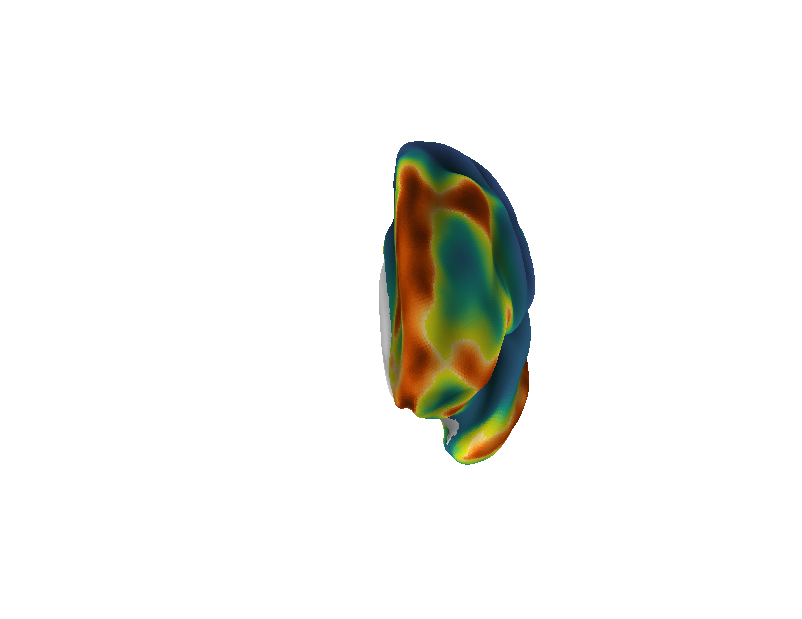

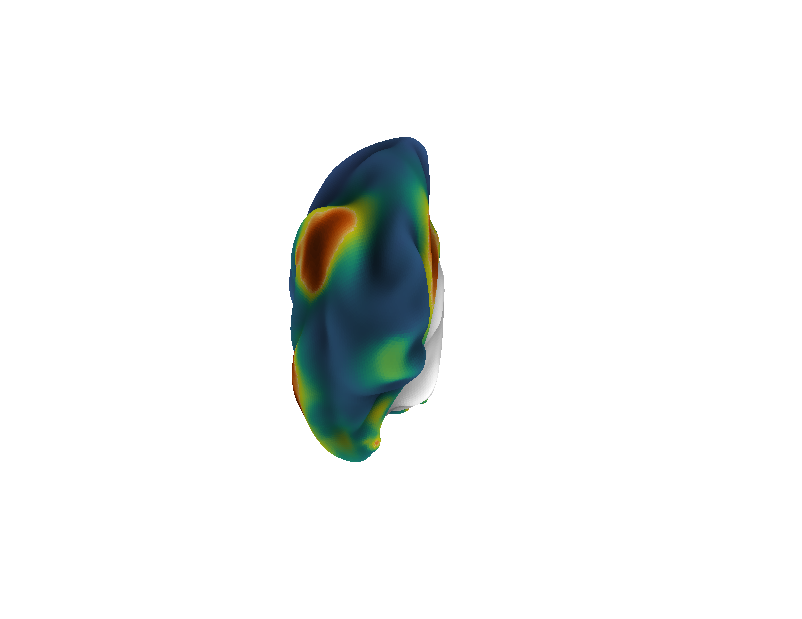

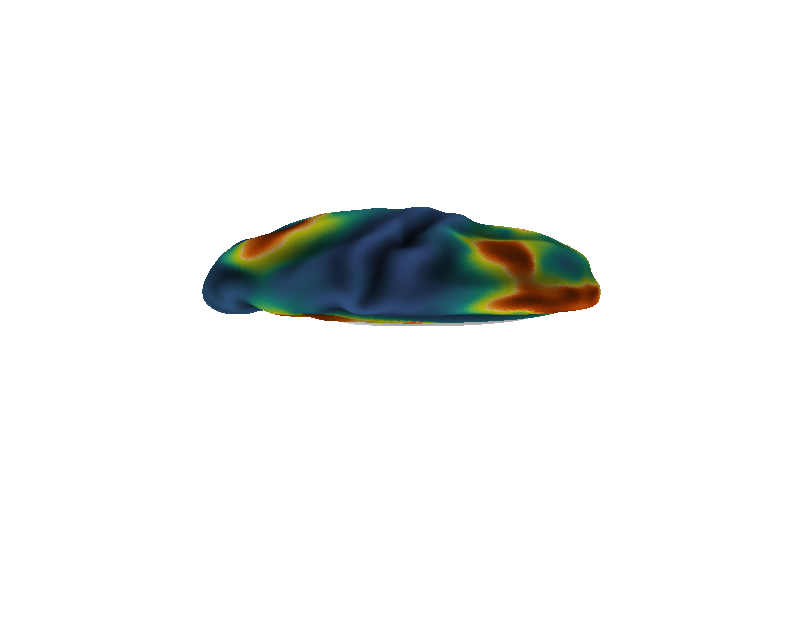

...

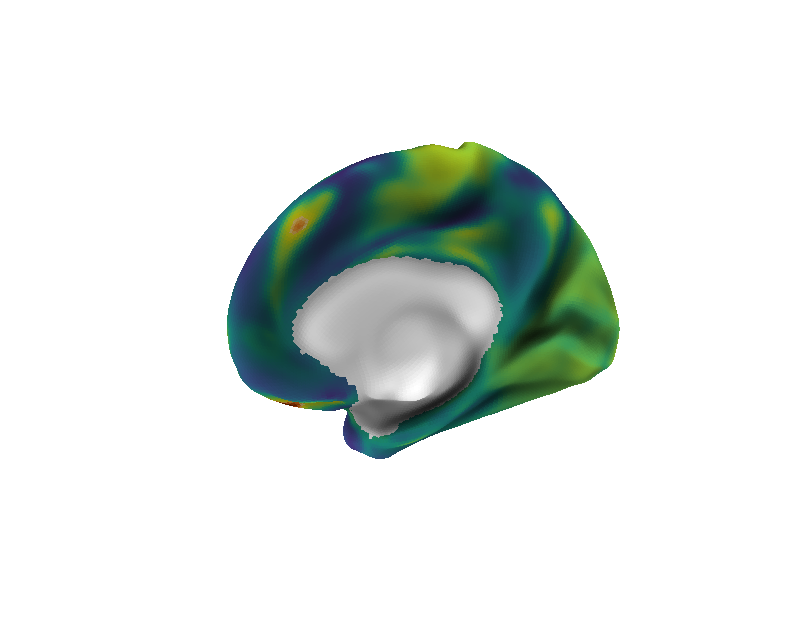

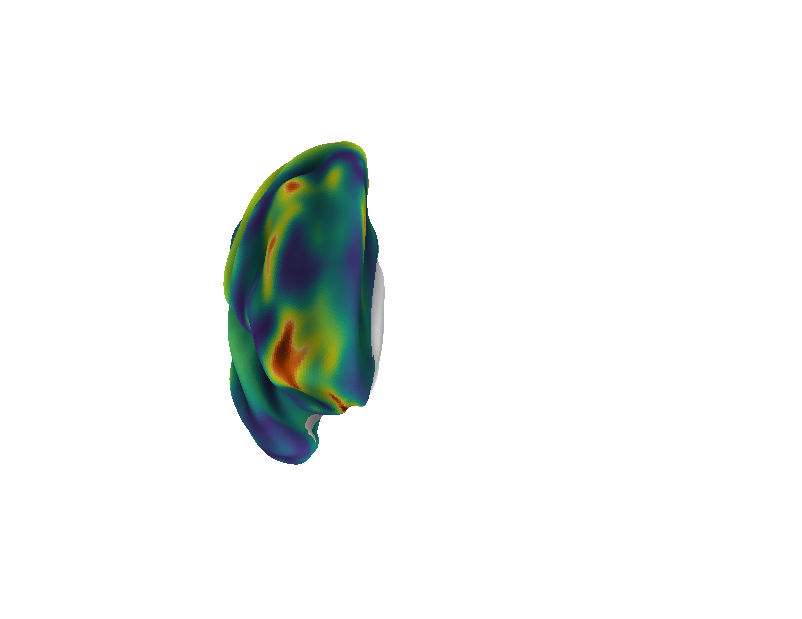

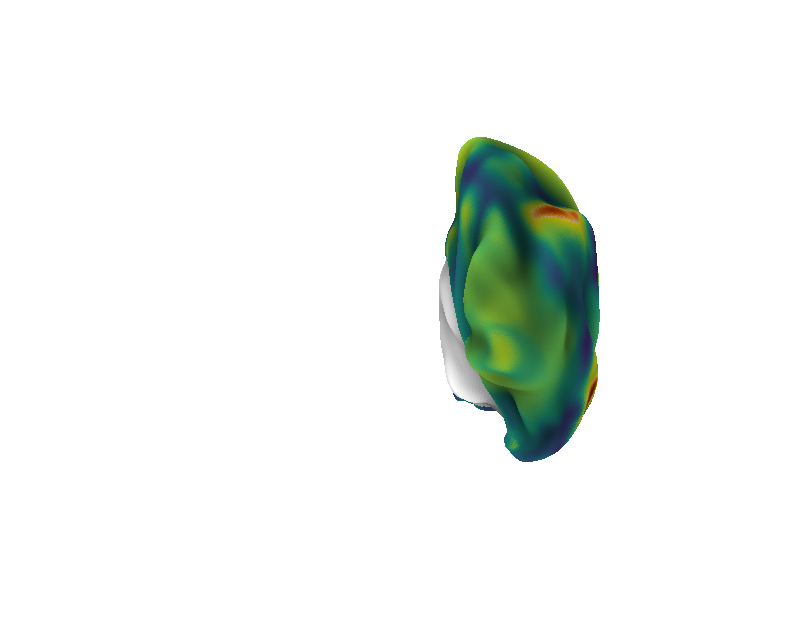

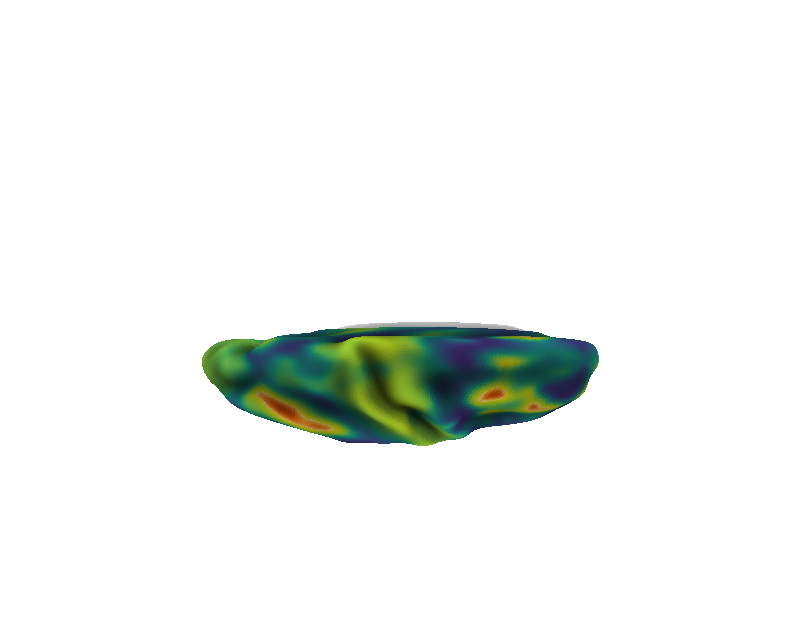

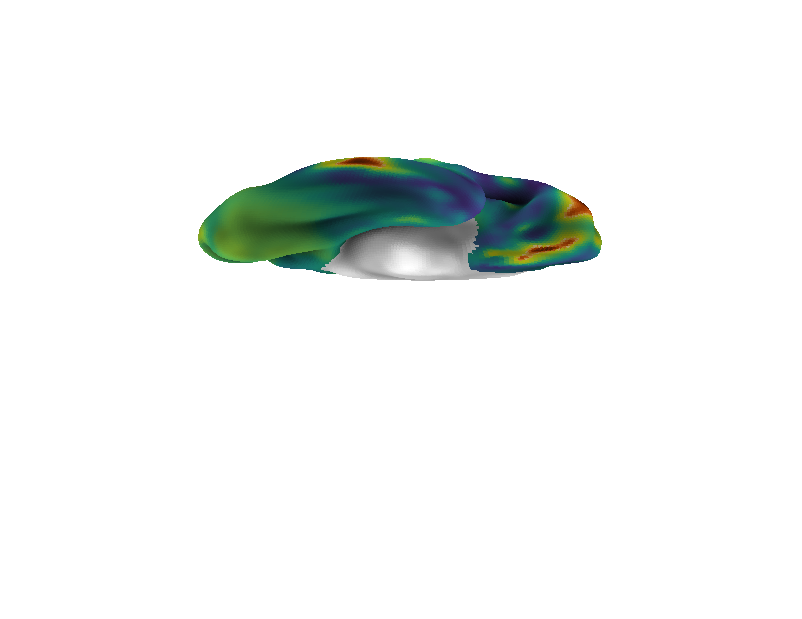

In [24]:
# for i in range(5):
#     showSurf(dataL[:,i].squeeze(), surfL, sulcL, cortL, showall=True, output_file='gradient_data/figures/embedded/fig.hcp.embed.%i.L' % i, symmetric_cbar = False,
#                         cmap=mymap, bg_scaling_factor=1.5)
#     showSurf(dataR[:,i].squeeze(), surfR, sulcR, cortR, showall=True, output_file='gradient_data/figures/embedded/fig.hcp.embed.%i.R' % i, symmetric_cbar = False,
#                         cmap=mymap, bg_scaling_factor=1.5)        


# showSurf(input_data, surf, sulc, cort, showall=None, output_file=None, symmetric_cbar='auto', cmap='jet')
for i in range(5):
    viz.showSurf(dataL[:,i].squeeze(), surfL, sulcL, cortL, showall=True, 
             output_file='gradient_data/figures/embedded/fig.hcp.embed.%i.L' % i, 
             symmetric_cbar=False, cmap=mymap)
    viz.showSurf(dataR[:,i].squeeze(), surfR, sulcR, cortR, showall=True, 
             output_file='gradient_data/figures/embedded/fig.hcp.embed.%i.R' % i, 
             symmetric_cbar=False, cmap=mymap)        

In [8]:
for i in range(5):
    print str(i + 1) + '  ' + str(np.min(emb[0:len(cortL)+len(cortR),i])) + '  ' + str(np.max(emb[0:len(cortL)+len(cortR),i]))

1  -5.42569  6.85772
2  -2.9718  5.66789
3  -2.92653  2.81415
4  -2.55092  1.22316
5  -1.4251  1.85395


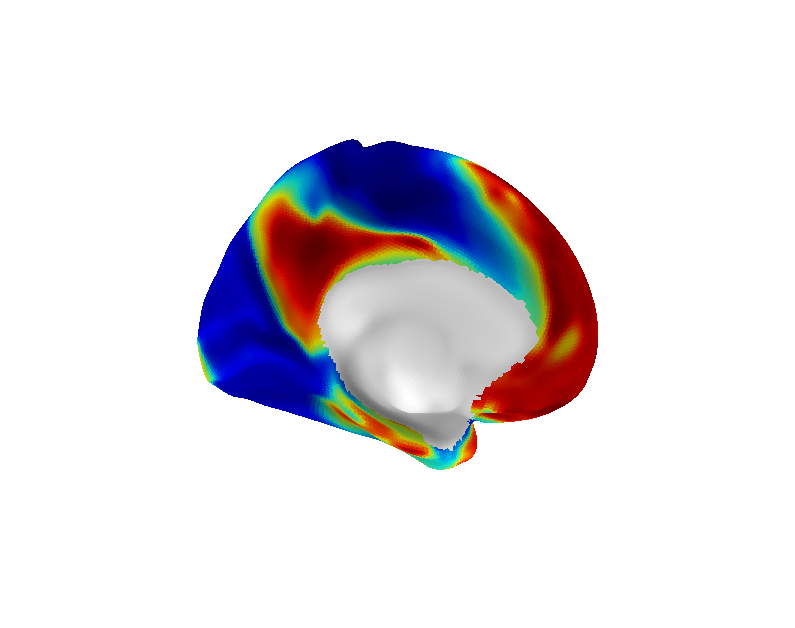

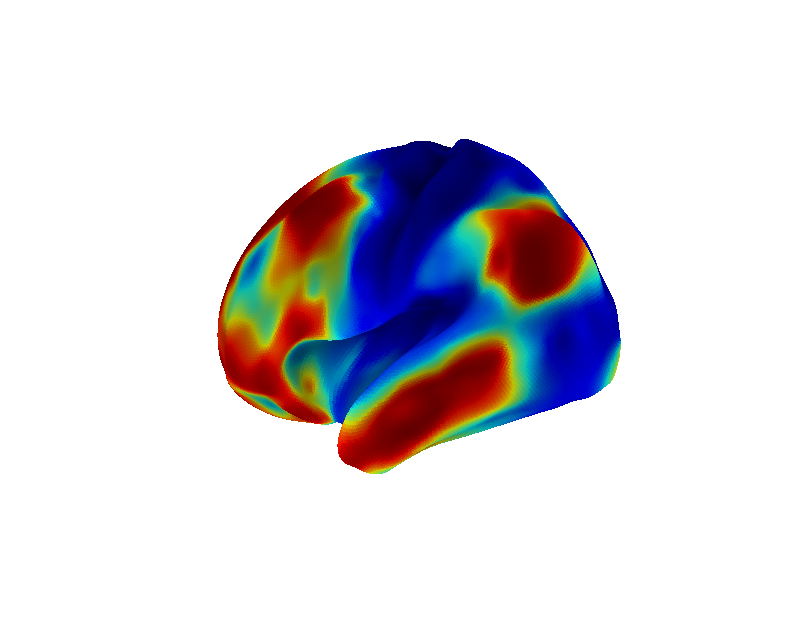

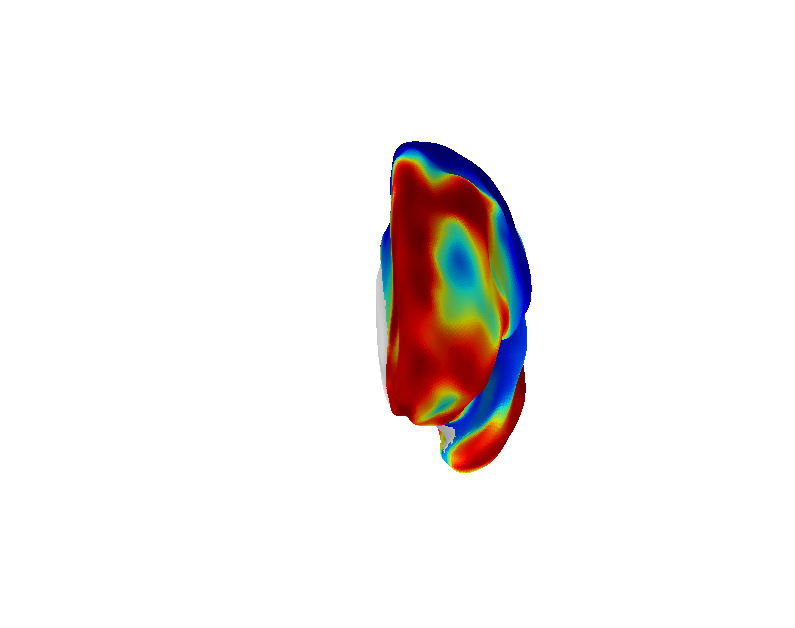

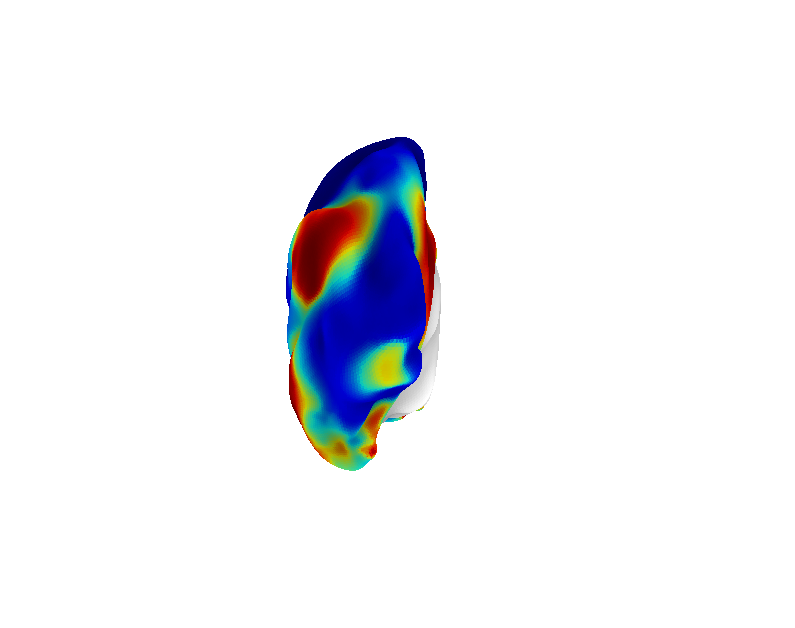

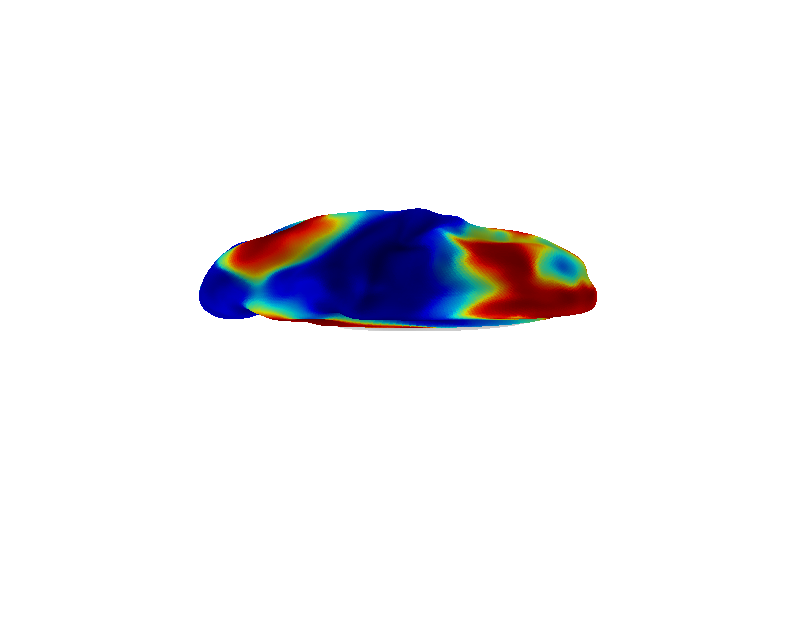

...

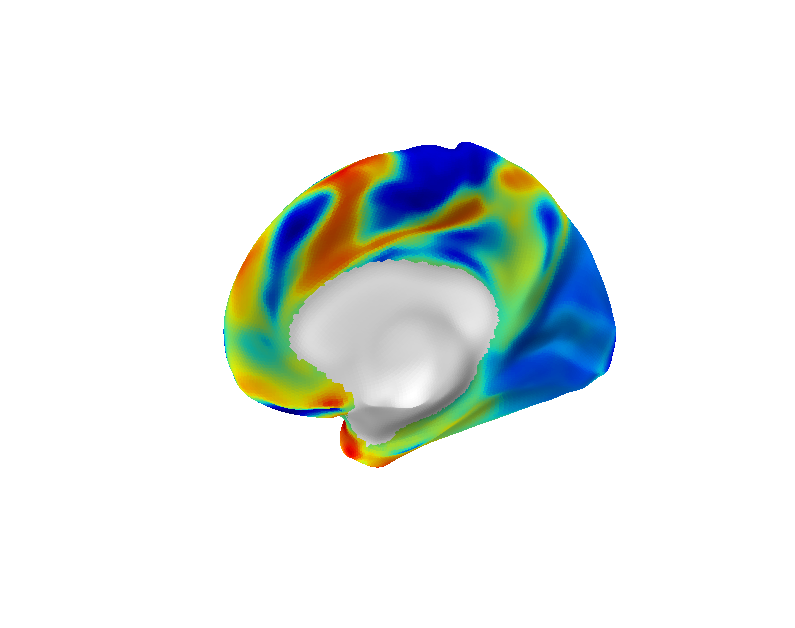

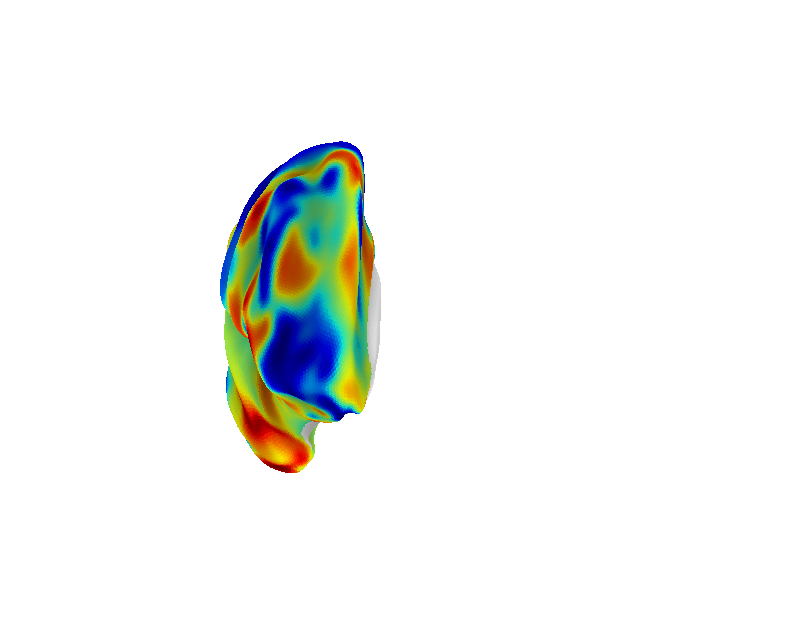

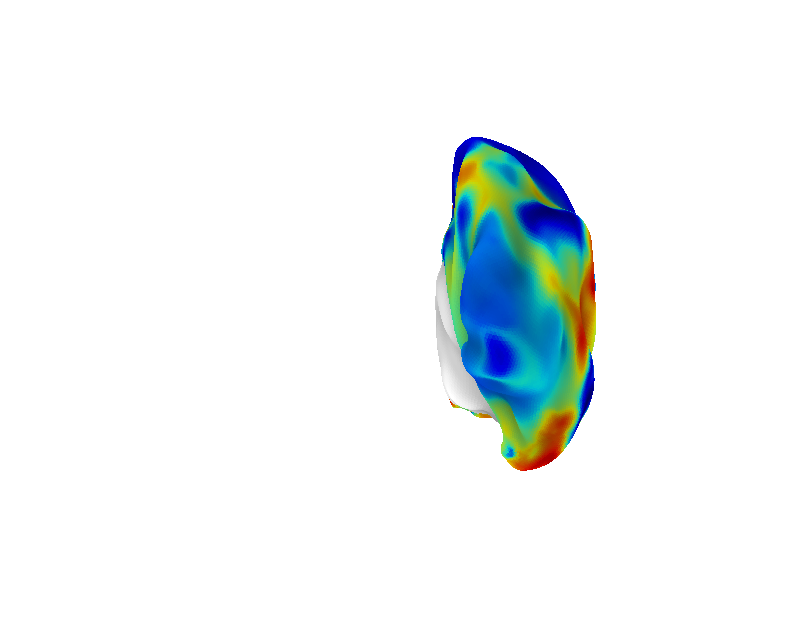

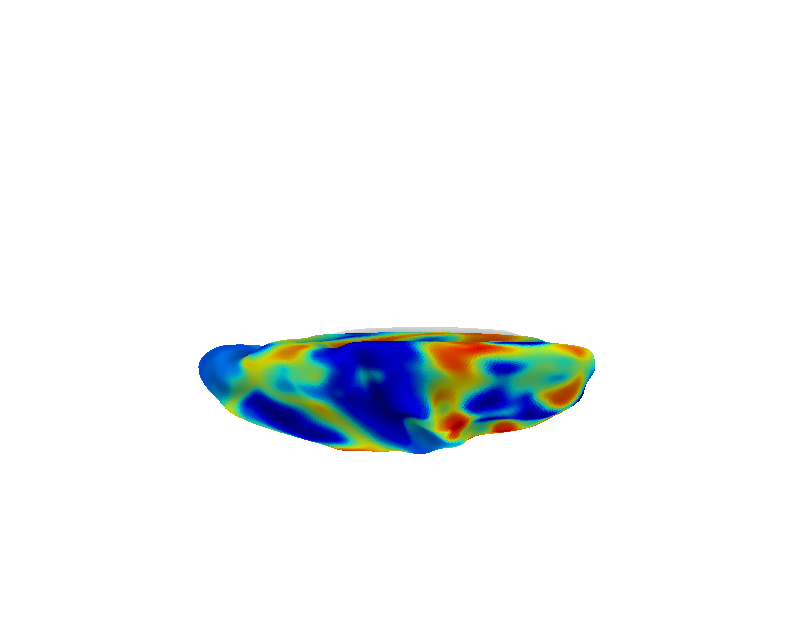

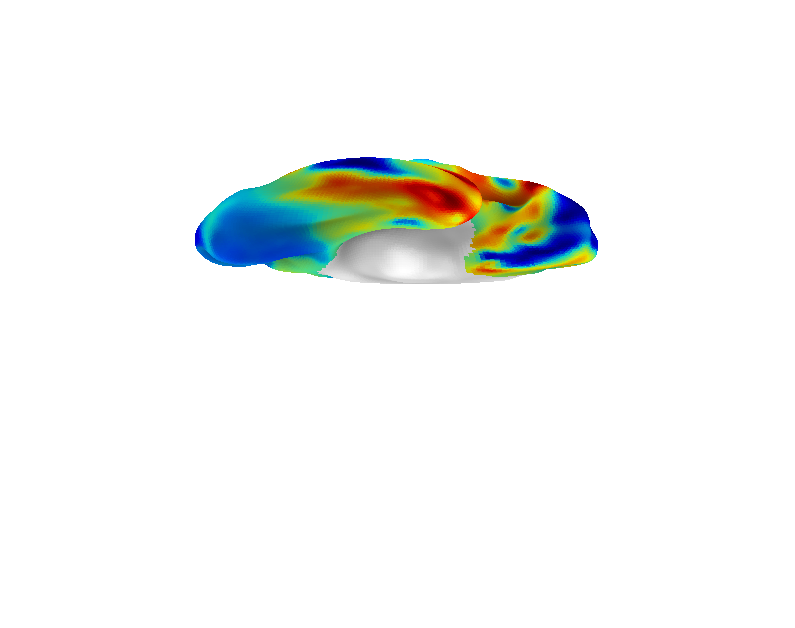

In [7]:
for i in range(5):
    showSurf(dataL[:,i].squeeze(), surfL, sulcL, cortL, showall=True, output_file='gradient_data/figures/embedded/fig.hcp.embed.jet.%i.L' % i, symmetric_cbar = False,
                        cmap='jet', bg_scaling_factor=1.5)
    showSurf(dataR[:,i].squeeze(), surfR, sulcR, cortR, showall=True, output_file='gradient_data/figures/embedded/fig.hcp.embed.jet.%i.R' % i, symmetric_cbar = False,
                        cmap='jet', bg_scaling_factor=1.5)   

In [15]:
for i in range(5):
    for j in range(6):
        for s in ['L','R']:
            imageCrop('gradient_data/figures/embedded/fig.hcp.embed.jet.%i.%s.%i.png' % (i, s, j))

In [16]:
# figure for neurosynth legend
emb_binned = np.percentile(dataL[cortL,0].squeeze(), range(5,105,5))
emb_b = dataL[cortL,0].copy()
for i in range(20):
    emb_b[np.where(emb_b <= emb_binned[i])[0]] = i+20
emb_b = emb_b-29.5
e_b = dataL[:,0].copy()
e_b[cortL] = emb_b
showSurf(e_b, surfiL, sulcL, cortL, showall=True, output_file='gradient_data/figures/embedded/fig.hcp.embed.%i.binned.L' % 0, 
        symmetric_cbar = False, cmap=mymap, bg_scaling_factor=1.5)

Traceback (most recent call last):
  File "/Applications/miniconda3/envs/topography/lib/python2.7/site-packages/IPython/core/ultratb.py", line 1118, in get_records
    return _fixed_getinnerframes(etb, number_of_lines_of_context, tb_offset)
  File "/Applications/miniconda3/envs/topography/lib/python2.7/site-packages/IPython/core/ultratb.py", line 300, in wrapped
    return f(*args, **kwargs)
  File "/Applications/miniconda3/envs/topography/lib/python2.7/site-packages/IPython/core/ultratb.py", line 345, in _fixed_getinnerframes
    records = fix_frame_records_filenames(inspect.getinnerframes(etb, context))
  File "/Applications/miniconda3/envs/topography/lib/python2.7/inspect.py", line 1049, in getinnerframes
    framelist.append((tb.tb_frame,) + getframeinfo(tb, context))
  File "/Applications/miniconda3/envs/topography/lib/python2.7/inspect.py", line 1009, in getframeinfo
    filename = getsourcefile(frame) or getfile(frame)
  File "/Applications/miniconda3/envs/topography/lib/python2

ERROR: Internal Python error in the inspect module.
Below is the traceback from this internal error.


Unfortunately, your original traceback can not be constructed.



IndexError: string index out of range

In [17]:
from PIL import Image

for i in range(5):

    i1 = Image.open('gradient_data/figures/embedded/fig.hcp.embed.jet.%i.L.0.png' % i)
    i2 = Image.open('gradient_data/figures/embedded/fig.hcp.embed.jet.%i.L.1.png' % i)
    i3 = Image.open('gradient_data/figures/embedded/fig.hcp.embed.jet.%i.L.2.png' % i)
    i4 = Image.open('gradient_data/figures/embedded/fig.hcp.embed.jet.%i.L.3.png' % i)
    i5 = Image.open('gradient_data/figures/embedded/fig.hcp.embed.jet.%i.L.4.png' % i)
    i6 = Image.open('gradient_data/figures/embedded/fig.hcp.embed.jet.%i.L.5.png' % i)

    result = Image.new("RGBA", (np.shape(i3)[1]+20+np.shape(i2)[1]+20+np.shape(i1)[1]+20+np.shape(i4)[1], 
                                np.shape(i1)[0]+20+np.shape(i5)[0]+20))
    result.paste(i3, (0, 0))
    result.paste(i2, (np.shape(i3)[1]+20, 0))
    result.paste(i1, (np.shape(i3)[1]+20+np.shape(i2)[1]+20, 0))
    result.paste(i4, (np.shape(i1)[1]+20+np.shape(i2)[1]+20+np.shape(i3)[1]+20, 0))
    result.paste(i5.rotate(180), (np.shape(i3)[1]+20, np.shape(i3)[0]+20))
    result.paste(i6, (np.shape(i3)[1]+20+np.shape(i2)[1]+20, np.shape(i3)[0]+20))
    result.save('gradient_data/figures/embedded/fig.hcp.embed.%i.L.all.png' % i)

    i1 = Image.open('gradient_data/figures/embedded/fig.hcp.embed.jet.%i.R.0.png' % i)
    i2 = Image.open('gradient_data/figures/embedded/fig.hcp.embed.jet.%i.R.1.png' % i)
    i3 = Image.open('gradient_data/figures/embedded/fig.hcp.embed.jet.%i.R.2.png' % i)
    i4 = Image.open('gradient_data/figures/embedded/fig.hcp.embed.jet.%i.R.3.png' % i)
    i5 = Image.open('gradient_data/figures/embedded/fig.hcp.embed.jet.%i.R.4.png' % i)
    i6 = Image.open('gradient_data/figures/embedded/fig.hcp.embed.jet.%i.R.5.png' % i)

    result = Image.new("RGBA", (np.shape(i3)[1]+20+np.shape(i2)[1]+20+np.shape(i1)[1]+20+np.shape(i4)[1], 
                                np.shape(i1)[0]+20+np.shape(i5)[0]+20))
    result.paste(i4, (0, 0))
    result.paste(i2, (np.shape(i3)[1]+20, 0))
    result.paste(i1, (np.shape(i3)[1]+20+np.shape(i2)[1]+20, 0))
    result.paste(i3, (np.shape(i1)[1]+20+np.shape(i2)[1]+20+np.shape(i3)[1]+20, 0))
    result.paste(i5, (np.shape(i3)[1]+20+np.shape(i2)[1]+20, np.shape(i3)[0]+20))
    result.paste(i6.rotate(180), (np.shape(i4)[1]+20, np.shape(i4)[0]+20))

    result.save('gradient_data/figures/embedded/fig.hcp.embed.%i.R.all.png' % i)


In [18]:
for i in range(5):
    i1 = Image.open('gradient_data/figures/embedded/fig.hcp.embed.%i.L.all.png' % i)
    i2 = Image.open('gradient_data/figures/embedded/fig.hcp.embed.%i.R.all.png' % i)
    result = Image.new("RGBA", (np.shape(i1)[1]+40+np.shape(i2)[1], np.shape(i1)[0]+40))
    result.paste(i1, (0, 0))
    result.paste(i2, (np.shape(i1)[1]+40, 0))
    result.save('gradient_data/figures/embedded/fig.hcp.embed.%i.both.all.png' % i)

In [19]:
i1 = Image.open('gradient_data/figures/embedded/fig.hcp.embed.0.both.all.png')
result = Image.new("RGBA", (np.shape(i1)[1], (np.shape(i1)[0]+30)*5))
for i in range(5):
    i1 = Image.open('gradient_data/figures/embedded/fig.hcp.embed.%i.both.all.png' % i)
    result.paste(i1, (0, (np.shape(i1)[0]+20)*i))

result.save('gradient_data/figures/embedded/fig.hcp.embed.all.both.all.png')

## Scatterplot of first two dimensions

In [25]:
import seaborn as sns

sns.set(style="white")
sns.set_context("notebook", font_scale=1.5)

df = pd.DataFrame()
df['e0'] = np.array(emb[range(cortLen),0])
df['e1'] = np.array(emb[range(cortLen),1]) * -1 # to reorient plot

In [31]:
emb.shape

(91282, 10)

In [32]:
import matplotlib.cm as cm

In [36]:
norm_1 = mpl.colors.Normalize(vmin=df['e0'].min(), vmax=df['e0'].max())
cmap_1 = cm.Reds
map_1 = cm.ScalarMappable(norm=norm_1, cmap=cmap_1)

In [37]:
norm_2 = mpl.colors.Normalize(vmin=df['e1'].min(), vmax=df['e1'].max())
cmap_2 = cm.Greens
map_2 = cm.ScalarMappable(norm=norm_2, cmap=cmap_2)

In [38]:
norm_3 = mpl.colors.Normalize(vmin=df['e1'].max() * -1, vmax=df['e1'].min() * -1)
cmap_3 = cm.Blues
map_3= cm.ScalarMappable(norm=norm_3, cmap=cmap_3)

In [39]:
c = np.ones(map_1.to_rgba(df['e0']).shape)

In [40]:
c.shape

(59412, 4)

In [43]:
a = df['e1'].copy()
a = a - a.min() 
a = a / a.max()
c[:,1] = a

In [45]:
c[:,1]

array([0.16289065, 0.35293845, 0.23999595, ..., 0.61162141, 0.56212345,
       0.56535069])

In [46]:
a = df['e1'].copy() * -1
a = a - a.min() 
a = a / a.max()
c[:,2] = a

In [47]:
c[:,2]

array([0.83710935, 0.64706155, 0.76000405, ..., 0.38837859, 0.43787655,
       0.43464931])

In [48]:
a = df['e0'].copy()
a = a - a.min() 
a = a / a.max()
c[:,0] = a

In [49]:
c[:,1] = c[:,1] * ((a - 1) *  -1)
c[:,2] = c[:,2] * ((a - 1) *  -1)

/export/scratch/b/han424/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/export/scratch/b/han424/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


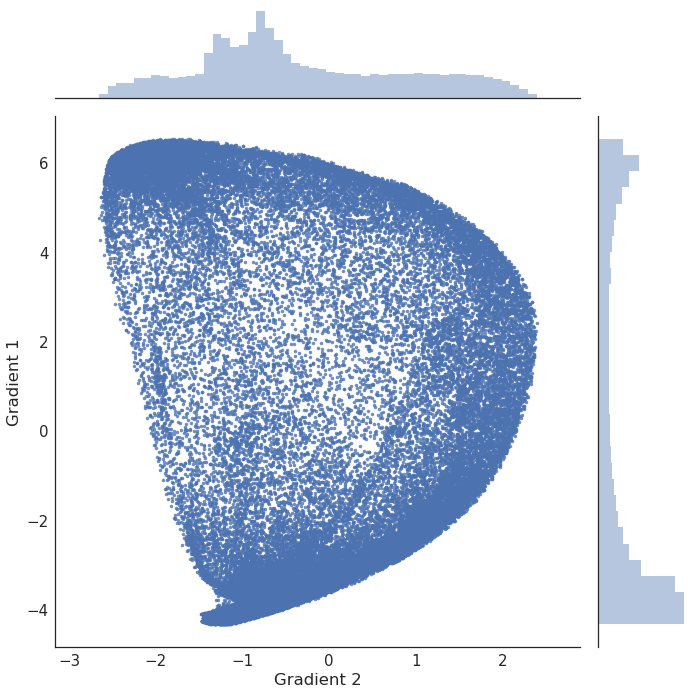

In [50]:
sns.set_context(font_scale=2)
g = (sns.jointplot('e1', 'e0', 
                   data=df, 
                   size=10, label='big', linewidth=0, marker='.', alpha=0.8,
                   ylim = [np.min(df['e0']) - 0.5, np.max(df['e0']) + 0.5], 
                   xlim=[np.min(df['e1']) - 0.5, np.max(df['e1']) + 0.5],
                   stat_func=None).set_axis_labels('Gradient 2', 'Gradient 1'))

In [61]:
np.array(c).reshape(-1, 4).shape

(59412, 4)

/export/scratch/b/han424/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/export/scratch/b/han424/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


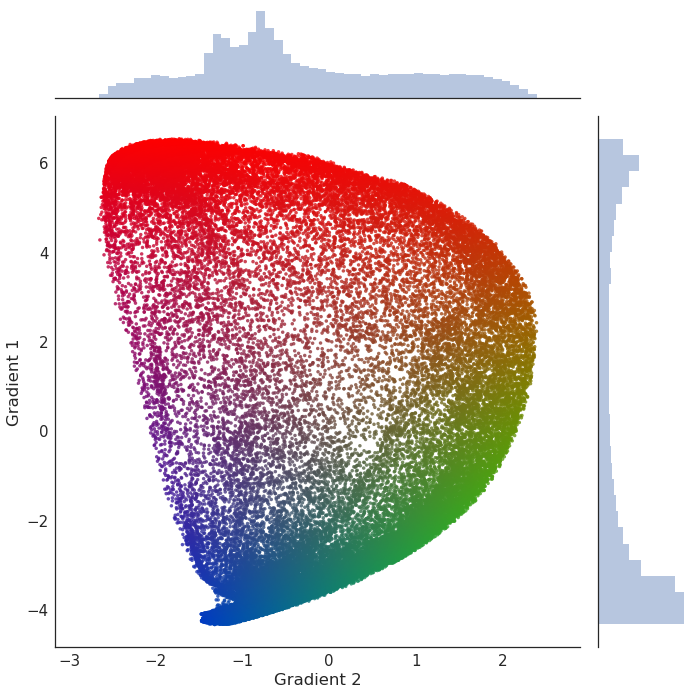

In [64]:
sns.set_context(font_scale=2)
g = (sns.jointplot('e1', 'e0', 
                   data=df, 
                   size=10, label='big', linewidth=0, marker='.', 
                   joint_kws={'color':None, 'c':c.tolist()}, alpha=0.8,
                   ylim = [np.min(df['e0']) - 0.5, np.max(df['e0']) + 0.5], 
                   xlim=[np.min(df['e1']) - 0.5, np.max(df['e1']) + 0.5],
                   stat_func=None).set_axis_labels('Gradient 2', 'Gradient 1'))

g.savefig('gradient_data/figures/fig.components.scatterplot.png', format='png', dpi=600, transparent=True)
# g.savefig('gradient_data/figures/fig.components.scatterplot.pdf', format='pdf')

A joinplot consist of the marginal plots on the sides (histograms by default) and the jointplot in the middle (a scatterplot by default), which you can read more about in the [JointGrid documentation](http://seaborn.pydata.org/generated/seaborn.JointGrid.html). 

In this case, you want to pass arguments to the scatter plot in the middle, which you can do with the joint_kws parameter in sns.jointplot(). This parameter takes a dictionary of parameter names and their arguments, and passes it to the function used to create the middle plot, in this case plt.scatter(). The c parameter controls the colors, and accepts a list of color tuples, so you will need to convert the array via c.tolist(). One last caveat is that seaborn already passes a color to the color parameter of plt.scatter(), so we need to set this to None to avoid raising an error from trying to set the marker colors twice.

https://stackoverflow.com/questions/41861443/how-to-color-individual-markers-in-seaborn-jointplot

In [56]:
def plot_surf_stat_multidim(coords, faces, face_colors=None, stat_map=None,
        elev=0, azim=0,
        cmap=None,
        threshold=None, bg_map=None,
        mask=None,
        bg_on_stat=False,
        alpha='auto',
        vmax=None, symmetric_cbar="auto",
        figsize=(14,11), label=None, lenient=None,
        **kwargs):

    ''' Visualize results on cortical surface using matplotlib'''

    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.tri as tri
    from mpl_toolkits.mplot3d import Axes3D    
    
    # load mesh and derive axes limits
    faces = np.array(faces, dtype=int)
    limits = [coords.min(), coords.max()]

    alpha = 1
    fig = plt.figure(figsize=figsize)    
    fig.patch.set_facecolor('white')
    ax1 = fig.add_subplot(111, projection='3d', xlim=limits, ylim=limits)
    ax1.grid(False)
    ax1.set_axis_off()
    ax1.w_zaxis.line.set_lw(0.)
    ax1.set_zticks([])
    ax1.view_init(elev=elev, azim=azim)
    #ax1.set_axis_off()

    # plot mesh without data
    p3dcollec = ax1.plot_trisurf(coords[:, 0], coords[:, 1], coords[:, 2],
                                triangles=faces, linewidth=0.,
                                antialiased=False,
                                color='white')
   
    #face_colors = np.mean(multidim(faces), axis=0)        
    p3dcollec.set_facecolors(face_colors)
    
    return fig


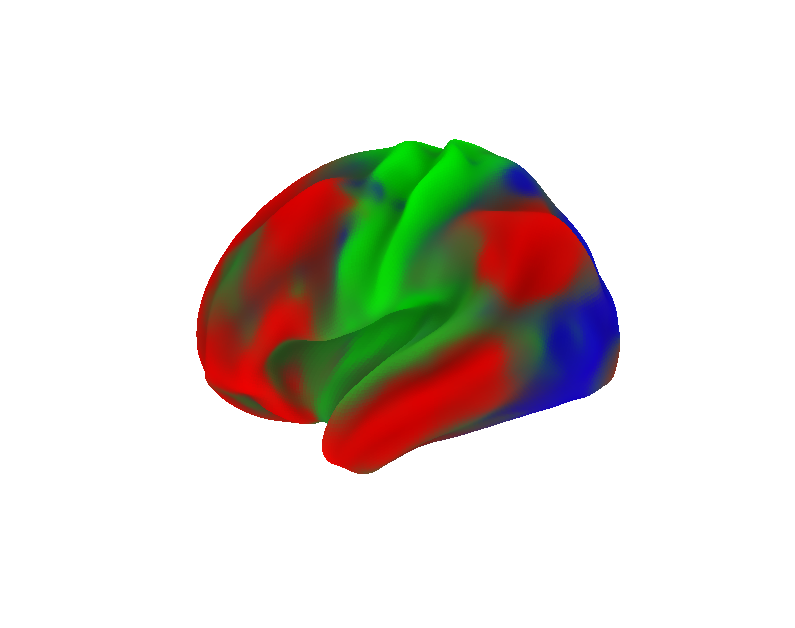

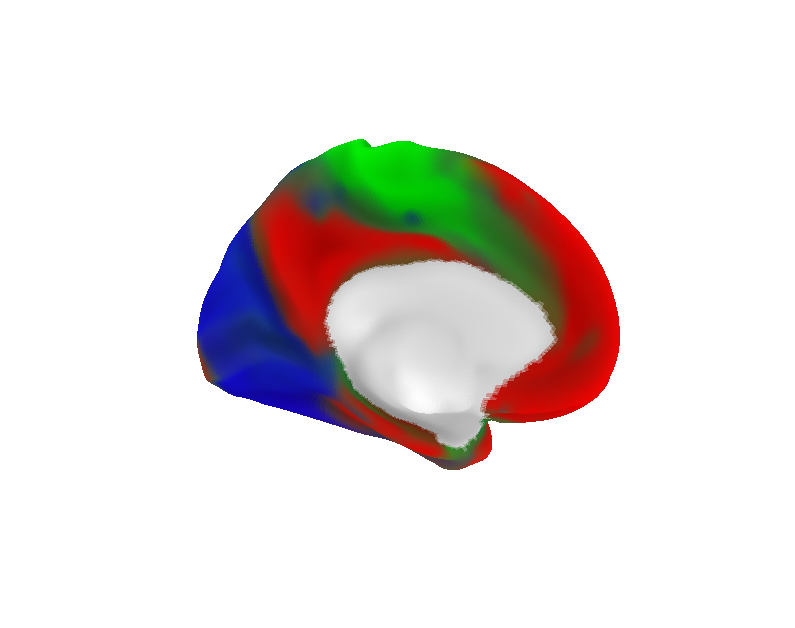

In [199]:
c = np.array(c)
d = np.ones((32492*2,4))
d[cortL,:] = c[range(len(cortL)),:]
bg_map=sulcL
bg_faces = np.mean(bg_map[surfL[1]], axis=1)
bg_faces = bg_faces - bg_faces.min() 
bg_faces = bg_faces / bg_faces.max() / 2.
face_colors = plt.cm.gray_r(bg_faces)
face_colors = np.mean(d[surfL[1]], axis=1) * face_colors

f = plot_surf_stat_multidim(surfL[0], surfL[1], bg_map=sulcL, face_colors=face_colors, azim=0, alpha=1)
f.savefig('gradient_data/figures/hcp.emb.0.multidim.lat.png')
f = plot_surf_stat_multidim(surfL[0], surfL[1], bg_map=sulcL, face_colors=face_colors, azim=180, alpha=1)
f.savefig('gradient_data/figures/hcp.emb.0.multidim.med.png')

# Macaque monkey connectivity data gradients

In [109]:
import numpy as np
import scipy as sp
import scipy.io

atlases = {'rm': 0, 'lv': 1, 'fv': 3, 'b05': 4, 'bb47': 5, 'pht00': 7}

# Load surfaces

mat = sp.io.loadmat('gradient_data/macaque/f99_vertices_faces.mat')
vertices = np.array(mat['vertices'], dtype=np.float64)
triangles = np.array(mat['faces'] - 1, dtype=np.int32)
# sulc = np.array(pd.read_csv('gradient_data/macaque/surf.sulc.asc', ' ', header=-1)[4]) * -1.
# nib.freesurfer.write_geometry('gradient_data/macaque/rh.pial', vertices, triangles)
# ! mris_inflate -sulc sulc -n 15 rh.pial inflated
sulc = nib.freesurfer.read_morph_data('gradient_data/macaque/rh.sulc') * -1
nodes = pd.read_csv('gradient_data/macaque/nodes_areaids.txt', '\t', header=-1)

def getIds(mat_name, names):
    
    lex = pd.read_csv('gradient_data/macaque/ids_areas.txt', ' ', header=-1)[1]

    ids = np.zeros(len(names))
    for i,y in enumerate(names):
        for n,x in enumerate(lex):
            if x == y:
                ids[i] = n
    return ids

def project_to_surface(mat_name, names, emb_comp):
    
    idx = getIds(mat_name, names)
    comp = emb_comp
    data = np.zeros(len(vertices))
    for n, x in enumerate(idx):
        if x != 0:
            data[np.where(nodes[atlases.get(mat_name)] == x)] = comp[n]
    data = np.squeeze(data)
    
    return data

def visualize_macaque(mat_name, comp, reverse=False):
    
    emb = np.load('gradient_data/conn_matrices/macaque_%s_emb.npy' % mat_name)
    names = np.load('gradient_data/conn_matrices/macaque_%s_names.npy' % mat_name)
    
    if reverse==True:
        
        emb[:,comp] = emb[:,comp] * -1
        
    data = project_to_surface(mat_name, names, emb[:,comp] - np.mean(emb[:,comp]))
    print np.max(data)
    print np.min(data)
    
    f = plot_surf_stat_map(vertices, triangles, bg_map=sulc, stat_map=data, mask=np.where(nodes[0] != 0.)[0], 
                       bg_on_stat=True, azim=10, elev=20, label=True, lenient=True, vmax=np.max(data), 
                       cmap=mymap, symmetric_cbar=False)
    fname = 'gradient_data/figures/fig.macaque.%s.%s.lat.png' % (mat_name, comp)
    f.savefig(fname, format='png', dpi=600, transparent=False)
    imageCrop(fname)
    plt.show()
    f = plot_surf_stat_map(vertices, triangles, bg_map=sulc, stat_map=data, mask=np.where(nodes[0] != 0.)[0], 
                       bg_on_stat=True, azim=180, elev=20, label=True, lenient=True, vmax=np.max(data),
                       cmap=mymap, symmetric_cbar=False)
    fname = 'gradient_data/figures/fig.macaque.%s.%s.med.png' % (mat_name, comp)
    f.savefig(fname, format='png', dpi=600, transparent=False)
    imageCrop(fname)    
    plt.show()

1.33089552769
-2.26094818755


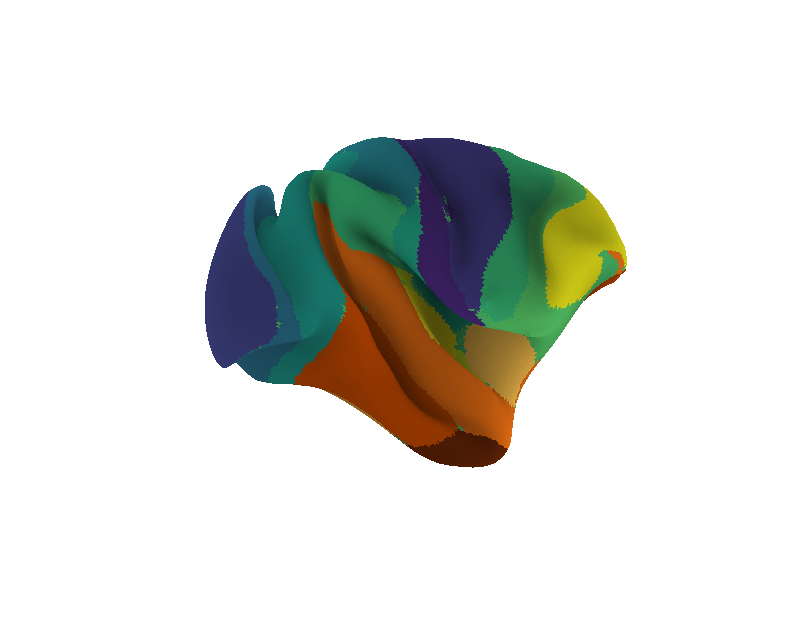

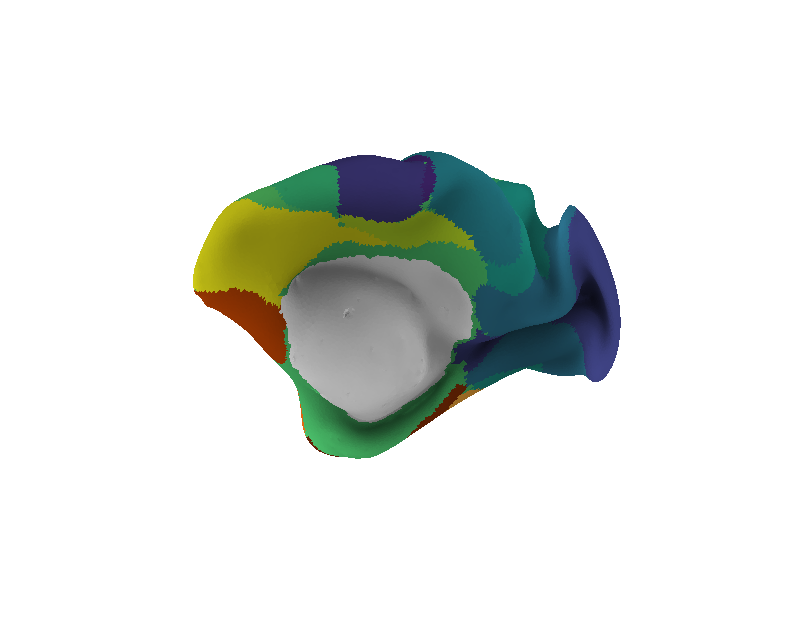

In [112]:
visualize_macaque('bb47', 0, reverse=False)